In [36]:
import os
import logging
import pandas as pd
import numpy as np
import pymc4 as pm
import tensorflow as tf

from stellr import Model, Emulator
from stellr.models import offset_beta, metallicity, luminosity

In [41]:
class StarMod(Model):
    '''
    Model a single star given observations of the parameters in the model for the Lyttle20 emulator.

    The `method` refers to the of an associated paper
    '''

    _vars = {
        'star': [
            'f_evol', 'mass', 'mlt', 'yi', 'zi', 'mhi', 'age', 'teff', 'delta_teff', 'teff_mod', 'rad', 'lum', 'dnu', 'mhs'
        ]
    }

    def _init_model(self):
        
        emulator = Emulator('Lyttle20')
        observed = self.observed['star']
        if not isinstance(observed, (pd.Series, pd.DataFrame)):
            observed = pd.Series(observed)
        
        observed = observed.drop(columns='name', errors='ignore').astype(np.float32)
        
        @pm.model
        def star():
            
            theta = {}
            for name in emulator.x_cols:
                low = emulator.x_limits[name]['start']
                high = emulator.x_limits[name]['end']
                theta[name] = yield offset_beta(1.2, 1.2, low, high, name=name)
            
            inputs = tf.stack([list(theta.values())])

            theta['delta_teff'] = yield offset_beta(1.2, 1.2, -200, 200, name='delta_teff')
            outputs = emulator(inputs)

            for i, name in enumerate(emulator.y_cols):
                theta[name] = yield pm.Deterministic(name, outputs[0, i])
            
            
            theta['mhi'] = yield pm.Deterministic('mhi', metallicity(theta['yi'], theta['zi']))
            theta['age'] = yield pm.Deterministic('age', 10**theta['log_age'])
            theta['lum'] = yield pm.Deterministic('lum', luminosity(theta['rad'], theta['teff']))
            theta['teff_mod'] = yield pm.Deterministic('teff_mod', theta['teff'] - theta['delta_teff'])
            
            # Any theta may be passed as an observed value.
            for key, value in theta.items():
                if key in observed.keys():
                    yield pm.Normal(f'{key}_obs', value, observed[f'{key}_err'], 
                                    observed=observed[key])            
        
        return star()

In [42]:
sun = {
#     'name': 'SUN',
    'mass': 1.0, 'mass_err': 0.001,
    'age': 4.6, 'age_err': 0.1,
    'teff_mod': 5777., 'teff_mod_err': 20.,
    'rad': 1.0, 'rad_err': 0.001,
    'lum': 1.0, 'lum_err': 0.01,
    'dnu': 135.1, 'dnu_err': 0.2,
    'mhs': 0.0, 'mhs_err': 0.01,
}

In [43]:
observed = {
#     'stars': pd.DataFrame(sun, index=[0])
    'star': sun
}

In [44]:
stars = StarMod(name='SUN', path='sun_deltaTeff_results', observed=observed)

logging.basicConfig(
    format='%(asctime)s: %(levelname)s: %(message)s', 
    filename=os.path.join(stars.savedir, 'star.log'), 
    level=logging.INFO,
)

In [45]:
sample_kwargs = {
    'num_samples': 2000,
    'burn_in': 100,
    'num_chains': 10,
    'xla': True,
    'adaptation_kwargs': {
        'target_accept_prob': 0.98,
    },
}

In [46]:
%%time
stars.fit(sample_kwargs=sample_kwargs)

2021-04-12 15:21:26,859 stellr.optimizer INFO     Fitting star for 2000 samples across 10 chains with 100 burn in steps per chain.
Auto-assigning NUTS sampler
Instructions for updating:
xla.experimental.compile is deprecated. Consider using tf.function(jit_compile=True)
Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.
CPU times: user 1min 56s, sys: 3.87 s, total: 2min
Wall time: 2min 6s


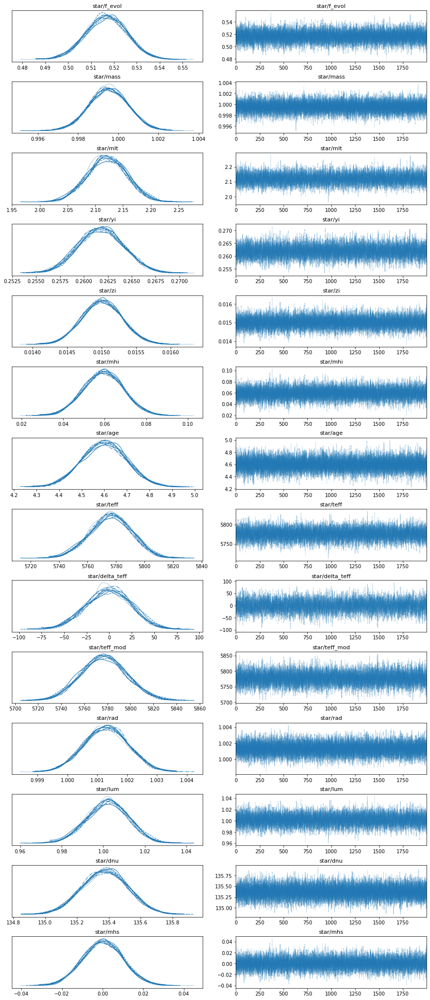

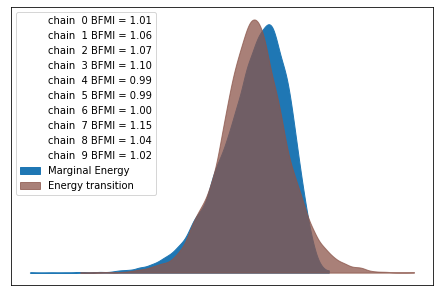

In [47]:
stars.plot_diagnostics(save=True);

In [48]:
stars.plot_corners(save=True)

In [49]:
output = stars.get_results()['star']
output.head()

,f_evol_16th,f_evol_50th,f_evol_84th,f_evol_ess_bulk,f_evol_ess_mean,f_evol_ess_sd,f_evol_ess_tail,f_evol_hdi_3%,f_evol_hdi_97%,f_evol_mcse_mean,f_evol_mcse_sd,f_evol_mean,f_evol_r_hat,f_evol_sd,mass_16th,mass_50th,mass_84th,mass_ess_bulk,mass_ess_mean,mass_ess_sd,mass_ess_tail,mass_hdi_3%,mass_hdi_97%,mass_mcse_mean,mass_mcse_sd,mass_mean,mass_r_hat,mass_sd,mlt_16th,mlt_50th,mlt_84th,mlt_ess_bulk,mlt_ess_mean,mlt_ess_sd,mlt_ess_tail,mlt_hdi_3%,mlt_hdi_97%,mlt_mcse_mean,mlt_mcse_sd,mlt_mean,...,lum_84th,lum_ess_bulk,lum_ess_mean,lum_ess_sd,lum_ess_tail,lum_hdi_3%,lum_hdi_97%,lum_mcse_mean,lum_mcse_sd,lum_mean,lum_r_hat,lum_sd,dnu_16th,dnu_50th,dnu_84th,dnu_ess_bulk,dnu_ess_mean,dnu_ess_sd,dnu_ess_tail,dnu_hdi_3%,dnu_hdi_97%,dnu_mcse_mean,dnu_mcse_sd,dnu_mean,dnu_r_hat,dnu_sd,mhs_16th,mhs_50th,mhs_84th,mhs_ess_bulk,mhs_ess_mean,mhs_ess_sd,mhs_ess_tail,mhs_hdi_3%,mhs_hdi_97%,mhs_mcse_mean,mhs_mcse_sd,mhs_mean,mhs_r_hat,mhs_sd
0,0.507717,0.516719,0.525482,10242.577687,10244.461389,10232.611467,12810.485017,0.499754,0.533113,0.000088,0.000062,0.516658,1.000323,0.008909,0.998578,0.999517,1.000494,19863.212484,19860.436626,19860.436626,15131.635339,0.997748,1.001381,0.000007,0.000005,0.999529,1.000306,0.000966,2.085634,2.120793,2.156392,7703.625467,7698.537809,7688.633005,9212.383628,2.053013,2.185544,0.000403,0.000285,2.121206,...,1.011934,7675.768801,7670.686572,7668.226362,10831.180425,0.983204,1.020283,0.000113,0.00008,1.002083,1.001165,0.009883,135.230078,135.376434,135.519933,19915.875038,19922.146274,19921.483265,17215.589711,135.100555,135.645096,0.001026,0.000725,135.375717,1.000036,0.144774,-0.009859,0.000172,0.009932,10675.409671,10676.499266,9894.407706,12239.585872,-0.018251,0.019198,0.000097,0.000071,0.00017,1.000273,0.009982


In [50]:
import numpy as np
import corner

from matplotlib import pyplot as plt

In [51]:
%matplotlib inline

In [52]:
posterior = stars.get_trace().posterior

In [53]:
var_names = stars.get_varnames()
var_names

['star/f_evol',
 'star/mass',
 'star/mlt',
 'star/yi',
 'star/zi',
 'star/mhi',
 'star/age',
 'star/teff',
 'star/delta_teff',
 'star/teff_mod',
 'star/rad',
 'star/lum',
 'star/dnu',
 'star/mhs']

In [54]:
n_samples = sample_kwargs['num_chains'] * sample_kwargs['num_samples']

In [55]:
xs = np.zeros((len(var_names), n_samples))
for i, name in enumerate(var_names):
    xs[i] = posterior[name].values.flatten()

In [63]:
labels = np.array([
    r'$f_\mathrm{evol}$',
    r'$M\,(\mathrm{M}_\odot)$',
    r'$\alpha_\mathrm{MLT}$',
    r'$Y_\mathrm{init}$',
    r'$Z_\mathrm{init}$',
    r'$[\mathrm{M/H}]_\mathrm{init}\,(\mathrm{dex})$',
    r'$\tau\,(\mathrm{Gyr})$',
    r'$T_\mathrm{eff}\,(\mathrm{K})$',
    r'$\Delta T_\mathrm{eff}\,(\mathrm{K})$',
    r'$T_\mathrm{eff}\,(\mathrm{K})$',
    r'$R\,(\mathrm{R}_\odot)$',
    r'$L\,(\mathrm{L}_\odot)$',
    r'$\Delta\nu\,(\mu\mathrm{Hz})$', 
    r'$[\mathrm{M/H}]_\mathrm{surf}\,(\mathrm{dex})$',
])

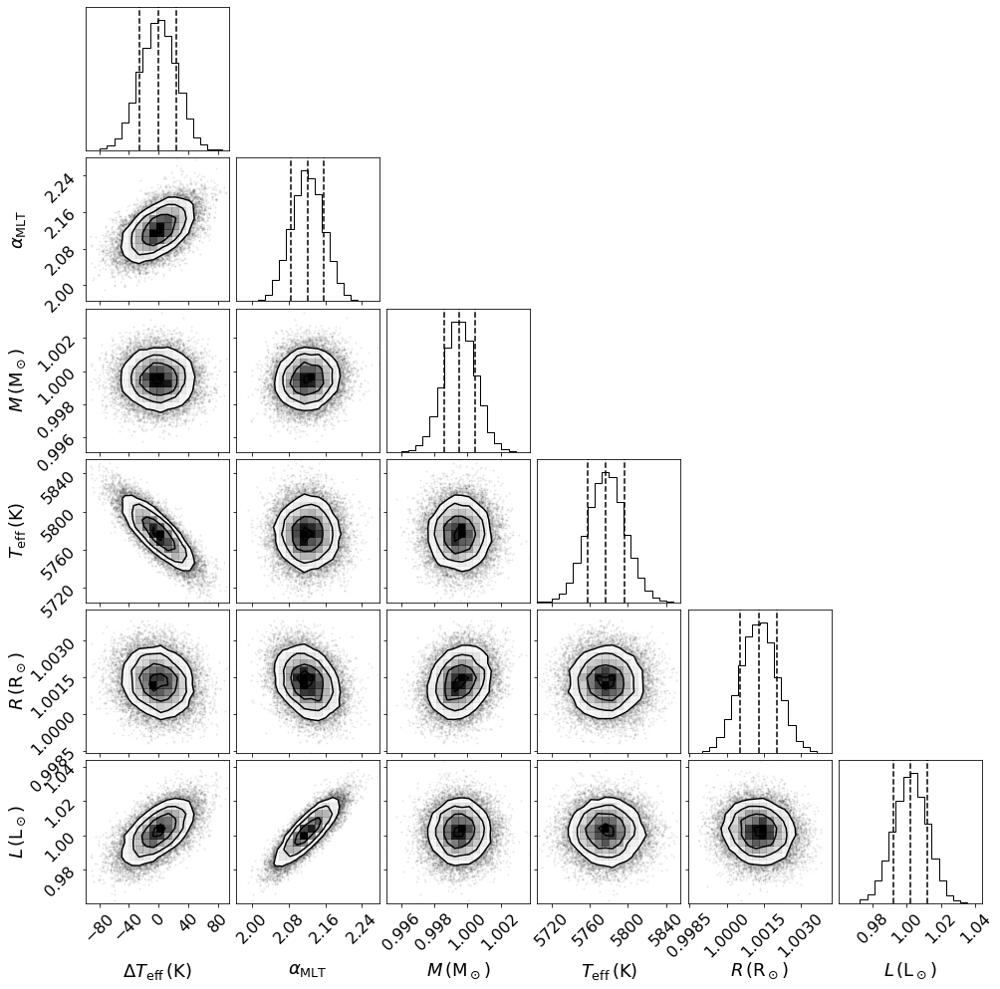

In [64]:
# plt.rc('axes', titlesize=16.)
plt.rc('axes', labelsize=18.)
plt.rc('xtick', labelsize=16.)
plt.rc('ytick', labelsize=16.)

idx = [-6, 2, 1, -5, -4, -3]
fig = corner.corner(xs[idx].T, labels=labels[idx], labelpad=.1, show_titles=False, quantiles=[.16, .5, .84])
# for ax in fig.get_axes():
#     ax.xaxis.labelpad = 20.